In [0]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.integrate import odeint
from matplotlib import animation
import matplotlib
import time
import sys
import math
from matplotlib import animation, rc, rcParams
from IPython.display import HTML
import time
import csv
from IPython.display import display
from sklearn.model_selection import train_test_split


# mount google drive
from google.colab import drive
drive.mount('/content/drive')

In [0]:
############## READING CSV ################
# read csv file into position and velocity lists
file_name = '/content/drive/My Drive/CIS522/Final Project/Datasets/swarm_03262020_100000timelag.csv'
my_data = []
with open(file_name) as csvDataFile:
  csvReader = csv.reader(csvDataFile)
  for row in csvReader:
    my_data.append(row)
pos_from_file = []
vel_from_file =[]
pos_line = []
vel_line = []

for i in range(len(my_data)):
  for j in range(int(len(my_data[0])/2)):
    try:
      pos_line_str = my_data[i][j*2].lstrip('[').rstrip(']').split()
      vel_line_str = my_data[i][j*2+1].lstrip('[').rstrip(']').split()
    except:
      pass
    pos_line.append([float(pos_line_str[0]), float(pos_line_str[1])])
    vel_line.append([float(vel_line_str[0]), float(vel_line_str[1])])
  pos_from_file.append(pos_line)
  vel_from_file.append(vel_line)
  pos_line = []
  vel_line = []

Number of time steps:  1000


KeyboardInterrupt: ignored

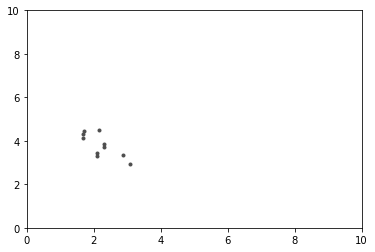

In [0]:
############ REPLAYING FILES ############
print("Number of time steps: ", len(pos_from_file))
anim_lst = pos_from_file.copy()
# Animating a single agent, assuming agents live on a 2D plane
# initializing animation parameters
fig = plt.figure()
ax = plt.axes(xlim=(0,10),ylim=(0,10))

anim_lst = np.array(anim_lst)
x = anim_lst[:,:,0]
y = anim_lst[:,:,1]
d, = ax.plot(x[0],y[0], c='0.3',marker='.',linestyle='None')
'''
# dynamically plotting
out=display(fig, display_id=True)
anim_len = len(anim_lst)
for i in range(anim_len):
  d.set_data(x[i],y[i])
  out.update(fig)
  time.sleep(0.005)
  plt.savefig('/content/swarm_noise_img/swarm'+str(i)+'.jpg')
'''

# embedding animation, problem is that embedding size is limited
anim_lst = anim_lst.tolist()
def animate(i):
  try:
    dots = anim_lst[0][:]
    d.set_data([dot[0] for dot in dots],[dot[1] for dot in dots])
    anim_lst.pop(0)
    return d,
  except:
    "done"
# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, frames=500, interval=50)
# anim.save('training_1000steps.mp4',writer=animation.FFMpegWriter(fps=10))
rc('animation', html='jshtml')
anim

In [0]:
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import torch.functional as F
%matplotlib inline
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [0]:
DATA_LEN = len(pos_from_file)
HEAD_TRUNCATION = 500
MAX_ITER = DATA_LEN - HEAD_TRUNCATION
NO_AGENT = 10
TEST_SIZE = 0.8
input_size = NO_AGENT*4

pos_input = np.array(pos_from_file[HEAD_TRUNCATION:DATA_LEN])
pos_input = np.reshape(pos_input,[MAX_ITER, -1])
vel_input = np.array(vel_from_file[HEAD_TRUNCATION:DATA_LEN])
vel_input = np.reshape(vel_input,[MAX_ITER, -1])

pos_train_data, pos_test_data, vel_train_data, vel_test_data = train_test_split(pos_input,vel_input,test_size=TEST_SIZE, shuffle=False)

train_data = np.concatenate((pos_train_data, vel_train_data),axis=1)
test_data = pos_test_data

scaler = MinMaxScaler(feature_range=(-1, 1))
train_data_normalized = scaler.fit_transform(train_data)

# train_data_normalized = train_data
train_data_normalized = torch.FloatTensor(train_data_normalized).view(-1,input_size)
print("train data size: ",train_data_normalized.size())
print("test data size: ", len(test_data))

train data size:  torch.Size([100, 40])
test data size:  400


In [0]:
test_data.shape

(400, 20)

In [0]:
# generating the dataset so that we can do supervised learning on it

def create_inout_sequences(input_data, tw):
    inout_seq = []
    L = len(input_data)
    for i in range(L-tw):
        train_seq = input_data[i:i+tw]
        train_label = input_data[i+tw:i+tw+1]
        inout_seq.append((train_seq ,train_label))
    return inout_seq

train_window = 5
train_inout_seq = create_inout_sequences(train_data_normalized, train_window)
# this sequence looks like, a list of tuples, which consist of data(list of data of window size) and label(next prediction)
print("train seq shape: ", len(train_inout_seq), ", 2, ", train_inout_seq[0][1].size())

train seq shape:  95 , 2,  torch.Size([1, 40])


In [0]:
print(train_inout_seq[0][0].shape)
print(train_inout_seq[0][1].shape)

torch.Size([5, 40])
torch.Size([1, 40])


In [0]:
class MLP(nn.Module):
  def __init__(self, input_size, output_size):
    super(MLP, self).__init__()
    # Write your code here
    self.linear1 = nn.Linear(input_size,256)
    self.linear2 = nn.Linear(256,512)
    self.linear3 = nn.Linear(512,256)
    self.linear5 = nn.Linear(256,64)
    self.linear4 = nn.Linear(64,output_size)
    self.prelu = nn.PReLU()
    self.relu = nn.ReLU()
    self.tanh = nn.Tanh()
    self.leakyrelu = nn.LeakyReLU()
    self.dropout = nn.Dropout(p=0.1)
  def forward(self, x):
    x = x.view(len(x),1, -1)
    x = self.linear1(x)
    # x = self.dropout(x)
    x = self.prelu(x)
    x = self.linear2(x)
    # x = self.dropout(x)
    x = self.prelu(x)
    x = self.linear3(x)
    # x = self.dropout(x)
    x = self.prelu(x)
    x = self.linear5(x)
    # x = self.dropout(x)
    x = self.prelu(x)
    x = self.linear4(x)
    return x[-1]

In [0]:
model = MLP(40,40)
model.to(device)

loss_function = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.0001)

In [0]:

########## Training RNN ##########
loss = []
epochs = 100
CHECKPOINT_PATH = "/content/drive/My Drive/Sp2020/CS522/Final Project/Codes/RNN_long"
model.train(True)
for i in range(epochs):
    running_loss = 0
    for j, data in enumerate(train_inout_seq):
      seq,labels = data

      seq.to(device)
      labels.to(device)
      optimizer.zero_grad()
      y_pred = model(seq)
      y_pred.requires_grad_(True)
      # y_pred = y_pred.reshape((1,y_pred.shape[2]))
      single_loss = loss_function(y_pred, labels)
      single_loss.backward()
      optimizer.step()
      running_loss += single_loss.item() 
    loss.append(running_loss)
    if i%1 == 0:
      print(f'epoch: {i:3} loss: {running_loss:10.3f}')
    
plt.plot(loss)
plt.xlabel('Loss')
plt.ylabel('Epochs')
plt.title('MLP Training Loss')
plt.ylim()
#       if i%25 == 0:
#         torch.save({'model': model,
#                     'loss': loss
#                       }, CHECKPOINT_PATH+".pth")
# print(f'epoch: {i:3} loss: {running_loss:10.10f}')
# torch.save({'model': model,
#             'loss': loss}, CHECKPOINT_PATH+".pth")

In [0]:
fut_pred = len(pos_test_data)
#fut_pred = len(pos_train_data)-train_window
test_inputs = train_data_normalized[-train_window:].tolist()
#test_inputs = train_data_normalized[0:train_window].tolist()
model.eval()
for i in range(fut_pred):
    # print(i)/
    seq = torch.FloatTensor(test_inputs[-train_window:])
    with torch.no_grad():
        test_inputs.append(model(seq).detach().numpy()[0].tolist())

# only keeps predicted values
# test_inputs = test_inputs[-fut_pred:]
actual_predictions = scaler.inverse_transform(test_inputs)

# discarding velocity information
actual_predictions = actual_predictions[:,0:int(input_size/2)]
actual_predictions = np.reshape(actual_predictions, [fut_pred+train_window,int(input_size/4),2])

# print(len(actual_predictions))
print('last step: ', np.reshape(pos_train_data[len(pos_train_data)-1], [10,2])[0])
print('prediction: ', actual_predictions[0][0])
print('ground truth: ', np.reshape(pos_test_data[0], [10,2])[0])

last step:  [3.80299254 7.3109618 ]
prediction:  [3.33030568 7.18050381]
ground truth:  [3.92490677 7.32853946]


In [0]:
############ REPLAYING FILES ############
from matplotlib.lines import Line2D
import matplotlib.lines as mlines

blue_dot = mlines.Line2D([], [], color='blue', marker='.', linestyle='None',
                          markersize=10, label='Prediction')
red_dot = mlines.Line2D([], [], color='red', marker='.', linestyle='None',
                          markersize=10, label='Ground Truth')
plt.legend(handles=[blue_dot, red_dot])

actual_predictions = np.array(actual_predictions)
pred_len = len(actual_predictions+1)
print("Predicted number of time steps: ", pred_len)

#ground_truth = np.reshape(pos_test_data, [len(pos_test_data), 32,2])
gt = np.concatenate((pos_train_data[-train_window:], pos_test_data),axis=0)
ground_truth = np.reshape(gt,  [pred_len, 10,2])

x = actual_predictions[:,:,0]
y = actual_predictions[:,:,1]
x_gt = ground_truth[:,:,0]
y_gt = ground_truth[:,:,1]

# x = gt_recon[:,:,0]
# y = gt_recon[:,:,1]
# x_gt = pred_recon[:,:,0]
# y_gt = pred_recon[:,:,1]

x_min = np.amin(x)-2
x_max = np.amax(x)+2
y_min = np.amin(y)-2
y_max = np.amax(y)+2

fig = plt.figure()
fig.set_size_inches(8, 8)
ax = plt.axes(xlim=(x_min,x_max),ylim=(y_min,y_max))



# initialize animation parameters
gg = [Line2D([x_gt[0][0], x[0][0]],[y_gt[0][0], y[0][0]]) for i in range(10)]
for j in range(10):
  gg[j], = ax.plot([x_gt[0][j], x[0][j]],[y_gt[0][j], y[0][j]], c='mediumspringgreen',marker='.')
d, = ax.plot(x[0],y[0], c='blue',marker='.',linestyle='None')
e, = ax.plot(x_gt[0],y_gt[0], c='red',marker='.',linestyle='None')

def animate(i):
    plt.legend(handles=[blue_dot, red_dot])
    for j in range(10):
      gg[j].set_data([x_gt[i][j], x[i][j]],[y_gt[i][j], y[i][j]])
    d.set_data(x[i],y[i])
    e.set_data(x_gt[i],y_gt[i])
    return e, d,

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, frames=400, interval=1, blit=False)
# anim.save('cool_vid.mp4',writer=animation.FFMpegWriter(fps=20))
rc('animation', html='jshtml')
anim


Output hidden; open in https://colab.research.google.com to view.

In [0]:
for i in range(400):
  print(y[i][0])

7.180503812839902
7.22187622445167
7.257312874019415
7.2869446628960635
7.3109618
4.491819412112254
4.493180528323688
4.492795711716076
4.492795332511693
4.49279519979016
4.4927951808299404
4.49279519979016
4.49279519979016
4.49279519979016
4.4927951808299404
4.4927951808299404
4.49279519979016
4.49279519979016
4.49279519979016
4.4927951808299404
4.49279519979016
4.49279519979016
4.49279519979016
4.4927951808299404
4.49279519979016
4.49279519979016
4.49279519979016
4.49279519979016
4.49279519979016
4.4927951808299404
4.4927951808299404
4.49279519979016
4.49279519979016
4.4927951808299404
4.49279519979016
4.49279519979016
4.4927951808299404
4.49279519979016
4.4927951808299404
4.4927951808299404
4.4927951808299404
4.4927951808299404
4.49279519979016
4.49279519979016
4.4927951808299404
4.4927951808299404
4.49279519979016
4.4927951808299404
4.49279519979016
4.49279519979016
4.49279519979016
4.49279519979016
4.49279519979016
4.49279519979016
4.49279519979016
4.49279519979016
4.4927951997901

Predicted number of time steps:  405


ValueError: ignored

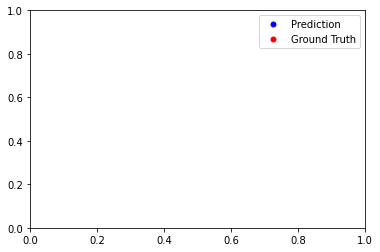

In [0]:
############ REPLAYING FILES ############
from matplotlib.lines import Line2D
import matplotlib.lines as mlines

blue_dot = mlines.Line2D([], [], color='blue', marker='.', linestyle='None',
                          markersize=10, label='Prediction')
red_dot = mlines.Line2D([], [], color='red', marker='.', linestyle='None',
                          markersize=10, label='Ground Truth')
plt.legend(handles=[blue_dot, red_dot])

pred_len = len(actual_predictions)

print("Predicted number of time steps: ", pred_len)

#ground_truth = np.reshape(pos_test_data, [len(pos_test_data), 32,2])
# gt = np.concatenate((pos_train_data[-train_window:], pos_test_data),axis=0)
ground_truth = np.reshape(pos_test_data,  [pred_len, 32,2])

fig = plt.figure()
fig.set_size_inches(8, 8)
ax = plt.axes(xlim=(2,8),ylim=(2,8))
actual_predictions = np.array(actual_predictions)
x = actual_predictions[:,:,0]
y = actual_predictions[:,:,1]
x_gt = ground_truth[:,:,0]
y_gt = ground_truth[:,:,1]

gg = [Line2D([x_gt[0][0], x[0][0]],[y_gt[0][0], y[0][0]]) for i in range(32)]
for j in range(32):
  gg[j], = ax.plot([x_gt[0][j], x[0][j]],[y_gt[0][j], y[0][j]], c='mediumspringgreen',marker='.')
d, = ax.plot(x[0],y[0], c='blue',marker='.',linestyle='None')
e, = ax.plot(x_gt[0],y_gt[0], c='red',marker='.',linestyle='None')

def animate(i):
    plt.legend(handles=[blue_dot, red_dot])
    dots = actual_predictions[i]
    # plotting a line between every pair of points
    for j in range(32):
      gg[j].set_data([x_gt[i][j], x[i][j]],[y_gt[i][j], y[i][j]])
    d.set_data([dot[0] for dot in dots],[dot[1] for dot in dots])
    dots_gt = ground_truth[i][:]
    e.set_data([dot[0] for dot in dots_gt],[dot[1] for dot in dots_gt])
    return e, d,

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, frames=100, interval=20, blit=True,)
#anim.save('compare_300steps_diff_dataset.mp4',writer=animation.FFMpegWriter(fps=10))
rc('animation', html='jshtml')
anim

(2005, 32)


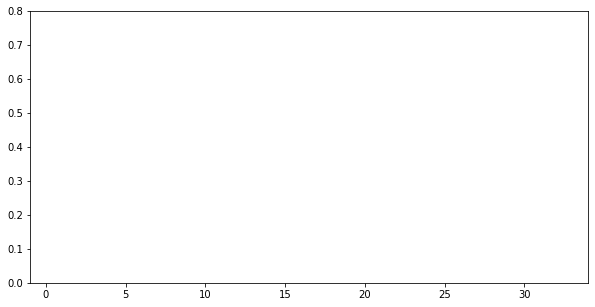

In [0]:
############ Animate Errors #############

# Calculating euclidean distances between each point
diff = np.abs(actual_predictions - ground_truth)
diff = np.sqrt(np.power(diff[:,:,0],2)+np.power(diff[:,:,1],2))
print(diff.shape)

def barlist(n): 
    return [1/float(n*k) for k in range(1,6)]

fig=plt.figure()
fig.set_size_inches(10, 5)
x= range(1,33)
ax = plt.axes(ylim=(0,0.8))
barcollection = plt.bar(x ,diff[0])

def animate(a):
    y=diff[a]
    for i, b in enumerate(barcollection):
        b.set_height(y[i])


anim=animation.FuncAnimation(fig,animate,repeat=False,blit=False,frames=1000,
                            interval=100)


anim.save('error_barplot.mp4',writer=animation.FFMpegWriter(fps=10))
rc('animation', html='jshtml')
anim